In [ ]:
from utils import index_files

index_files('dataset/images', 'wb')

In [2]:
import tensorflow as tf
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from tqdm import tqdm

def load_images(path, return_filenames=False):
  path = Path(path)
  # Ensures only valid image files are loaded
  img_paths = list(path.glob('*.jpg')) + list(path.glob('*.jpeg')) + list(path.glob('*.png')) \
              + list(path.glob('*.gif'))
  images = []
  filenames = []
  print(f'Loading {len(img_paths)} images')
  for img_path in tqdm(img_paths):
    # load image
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224,224))
    images.append(img)
    filenames.append(img_path.name)
  print('images loaded as' , type(images[0]), 'type')
  
  if return_filenames:
    return images, filenames
  else:
    return images

In [16]:
path = 'dataset/images/'
images, filenames = load_images(path, return_filenames=True)

Loading 1112 images


100%|██████████| 1112/1112 [01:46<00:00, 10.44it/s]

images loaded as <class 'PIL.Image.Image'> type


In [ ]:
from keras import backend as K 

model = tf.keras.applications.VGG19(
    include_top=True,
    weights="imagenet",
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax",)

model.summary()

layer_outputs = [layer.output for layer in model.layers[1:-1]]  # Identifies layer outputs
# Creates a model that will return the layer feature maps as outputs for a given image
visual_model = tf.keras.models.Model(inputs = model.input, outputs = layer_outputs) 

layer_names = [layer.name for layer in visual_model.layers]

for i, layer in enumerate(layer_names):
    print(i, layer)

In [ ]:
def get_embeddings(f_levels, images, filenames=None):

  # Create a single string with all the f_levels
  levels = '_'.join([str(f) for f in f_levels])
  path = Path(f'./dataset/embeddings/{levels}')
  path.mkdir(parents=True, exist_ok=True)
  # Initialize embeddings
  E = []
  for i, img in enumerate(images):
    print('embedding image', i)
    img = np.expand_dims(img, axis=0)
    img = tf.keras.applications.vgg19.preprocess_input(img)       # Pre-processes image for VGG19
    # run an image through the network by making a prediction
    feature_maps = visual_model.predict(img)
    
    temp = np.zeros((0))
    for level in f_levels:
      A = feature_maps[level]
      # Flatten feature map to 2x2 matrix if it is 4D (e.g. Conv layer)
      if len(A.shape) == 4:
        A = A.reshape(A.shape[0], A.shape[1]*A.shape[2], A.shape[3], order='F')
        A = A.reshape(A.shape[1], A.shape[2])
        # Compute Gram matrix (cummulative co-activation of filter per layer)
        G = np.matmul(np.transpose(A),A)
        # Append this layer's flattened Gram matrix to images embedding
        dummy = np.zeros(temp.shape[0] + G.flatten().shape[0])
        dummy[:temp.shape[0]] = temp
        dummy[temp.shape[0]:] = G.flatten()
        emb = np.copy(dummy) 
      # Flatten feature map to 1D vector if it is 2D (e.g. FC layer)
      else:
        emb = np.copy(A.flatten())

    E.append(np.copy(emb))

    # convert layer names to a single string all of them concatenated
    layers = '_'.join([str(f) for f in f_levels])

    if filenames is not None:
      # save embeddings as .npy files
      filename = filenames[i].split('.')[0]
      np.save(f'./dataset/embeddings/{layers}/{filename}', emb)

    if i%10 == 0:
      print(f'Getting embedding of img no. {i}, with shape {E[i].shape}, and {len(f_levels)} layers')
    
  return np.array(E)


# Select the layer from which to extract feature maps (conv1_1 is layer 0)
f_levels = [19, 9, 1]        # Choose from [1,4,9,14,19,22,23]

# Get embeddings for 'test' dataset
embeddings = get_embeddings(f_levels, images, filenames=filenames)

In [3]:
import shutil
from pathlib import Path
import numpy as np

def find_duplicates(dir, layer, thresh=0.3, delete=False):

    num_duplicates = 0
    dup_filenames = []

    # create duplicates folder from dir
    Path(f'{dir}/duplicates/images').mkdir(parents=True, exist_ok=True)
    Path(f'{dir}/duplicates/embeddings').mkdir(parents=True, exist_ok=True)

    # Load embeddings
    embeddings = []
    img_filenames = []
    emb_filenames = []
    embedding_path = Path(dir) / 'embeddings' / layer
    for file in embedding_path.glob('*.npy'):
        embeddings.append(np.load(file))
        emb_filenames.append(file.name)
        img_filenames.append(file.name.split('.')[0] + '.jpg')
    embeddings = np.array(embeddings)

    print('embeddings shape', embeddings.shape)

    # Fit 5 Nerest Neighbors model to embeddings
    knnbr = NearestNeighbors(n_neighbors=6).fit(embeddings)

    
    # Iterate through all files in embeddings dir
    dup_indexes = set()
    count = 0
    for i in range(embeddings.shape[0]):
        # Check if the image has already been identified as a duplicate
        if i not in dup_indexes:
            count += 1
            # print('Analyzing embedding and image', emb_filenames[i], img_filenames[i])
            knn = knnbr.kneighbors(embeddings[i].reshape(1, -1))
                        
            # Gets the distance and indexes of the k nearest neighbors (minus the first one, which is the query image)
            distances = knn[0][0]
            indexes = knn[1][0]

            # Remove duplicates
            for j in range(len(indexes)):
                index = indexes[j]
                distance = distances[j]
                
                if distance < thresh and index != i:
                    dup_filenames.append(img_filenames[index])
                    num_duplicates += 1
                    dup_indexes.add(index)
                    print('found duplicate', img_filenames[i], '----', img_filenames[index])
                    # Copy the duplicated image into the duplicates folder
                    image_path = Path(dir) / 'images' / img_filenames[i]
                    dup_image_path = Path(dir) / 'duplicates' / 'images' / img_filenames[i]
                    
                    neighbor_image_path = Path(dir) / 'images' / img_filenames[index]
                    dup_name = img_filenames[i].split('.')[0] + '_' + str(round(distance)) + '_dup.jpg'
                    dup_neighbor_image_path = Path(dir) / 'duplicates' / 'images' / dup_name
                    # copy files to duplicates folder
                    shutil.copy(image_path, dup_image_path)
                    shutil.copy(neighbor_image_path, dup_neighbor_image_path)
            
    print('Found a total of', num_duplicates, 'duplicates')
    print('Analyzed', count, 'images')
    return dup_filenames
                

dir = 'dataset'
duplicate_files = find_duplicates(dir, '23', thresh=30.0, delete=False)

embeddings shape (1112, 4096)
found duplicate wb_1027.jpg ---- wb_635.jpg
found duplicate wb_1030.jpg ---- wb_755.jpg
found duplicate wb_1040.jpg ---- wb_355.jpg
found duplicate wb_105.jpg ---- wb_722.jpg
found duplicate wb_1054.jpg ---- wb_698.jpg
found duplicate wb_1059.jpg ---- wb_732.jpg
found duplicate wb_1063.jpg ---- wb_29.jpg
found duplicate wb_1067.jpg ---- wb_991.jpg
found duplicate wb_107.jpg ---- wb_261.jpg
found duplicate wb_1072.jpg ---- wb_80.jpg
found duplicate wb_1072.jpg ---- wb_370.jpg
found duplicate wb_1074.jpg ---- wb_206.jpg
found duplicate wb_1082.jpg ---- wb_992.jpg
found duplicate wb_1083.jpg ---- wb_917.jpg
found duplicate wb_1085.jpg ---- wb_1106.jpg
found duplicate wb_1090.jpg ---- wb_386.jpg
found duplicate wb_1099.jpg ---- wb_720.jpg
found duplicate wb_1105.jpg ---- wb_297.jpg
found duplicate wb_1108.jpg ---- wb_159.jpg
found duplicate wb_111.jpg ---- wb_463.jpg
found duplicate wb_1110.jpg ---- wb_895.jpg
found duplicate wb_114.jpg ---- wb_481.jpg
found d

In [12]:
def remove_duplicates(duplicate_files, exceptions=None):
    dataset_path = Path('dataset')
    images_path = dataset_path / 'images'
    embeddings_path = dataset_path / 'embeddings'

    # Detele duplicate images
    for file in duplicate_files:
        if exceptions is not None and file not in exceptions:
            image_path = images_path / file
            test_image_path = Path('test_images') / file
            if image_path.exists():
                image_path.unlink()
                print('Deleted', file)
            if test_image_path.exists():
                test_image_path.unlink()
                print('Deleted from test images', file)

    # Delete duplicate embeddings (crawl through all layers)
    layers = [entry.name for entry in embeddings_path.iterdir() if entry.is_dir()]

    for layer in layers:  
        for file in duplicate_files:
            if exceptions is not None and file not in exceptions:
                root_filename = file.split('.')[0]
                embedding_path = embeddings_path / layer / (root_filename + '.npy')
                # check if file exists
                if embedding_path.exists():
                    embedding_path.unlink()
                    print('Deleted', embedding_path)

exceptions = ['wb_481.jpg', 'wb_473.jpg']

remove_duplicates(duplicate_files, exceptions=exceptions)
        
    

Deleted from test images wb_1106.jpg
Deleted from test images wb_437.jpg


In [16]:
# Load 'test' dataset (query images)
test_path = 'test_images/'
test_images, test_filenames = load_images(test_path, return_filenames=True)

# Load 'train' dataset (candidate images to be retrieved)
train_path = 'dataset/images/'
train_images, train_filenames = load_images(train_path, return_filenames=True)

Loading 42 images


100%|██████████| 42/42 [00:01<00:00, 22.13it/s]


images loaded as <class 'PIL.Image.Image'> type
Loading 1029 images


100%|██████████| 1029/1029 [00:52<00:00, 19.71it/s]

images loaded as <class 'PIL.Image.Image'> type


In [8]:
# Loads pre-computed embeddings for the images
def load_precomp_embeddings(filenames, layer, path='./dataset/embeddings/'):
    embeddings = []
    for filename in tqdm(filenames):
        emb = np.load(f'{path}/{layer}/{filename.split(".")[0]}.npy')
        embeddings.append(emb)
    return embeddings

In [9]:
from skimage.metrics import structural_similarity as ssim

def get_query_distances(query_results, type='image'):

    query_distances = []
    
    # get the pairwise distances between the query results
    for i in range(1, len(query_results)):
        if type == 'image':
            # get SSIM distance
            pairwise_distance = ssim(np.array(query_results[i]), np.array(query_results[i-1]), channel_axis=-1)
        else:
            pairwise_distance = np.linalg.norm(query_results[i] - query_results[i-1])
        
        query_distances.append(pairwise_distance)
    
    return query_distances

In [10]:
def get_knn_for_query(e, knnbr, train_images, train_embeddings):
  # Get the neighbors of the query image
  knn = knnbr.kneighbors(e)
            
  # GETS THE IMAGES OF THE KNN
  knn_images = []
  # Retrieve the k nearest neighbor images of the query image 
  for i in knn[1][0][1:]:
    knn_images.append(train_images[i])

  # GETS THE EMBEDDINGS OF THE KNN
  knn_E = []
  # Retrieve the k nearest neighbor embeddings of the query image 
  for i in knn[1][0][1:]:
    knn_E.append(train_embeddings[i])

  distances = knn[0][0][1:]

  return knn_images, knn_E, distances

Loading test embeddings


100%|██████████| 42/42 [00:00<00:00, 978.05it/s]


Loading train embeddings


100%|██████████| 1029/1029 [00:00<00:00, 1540.65it/s]


Fitting KNN model to embeddings


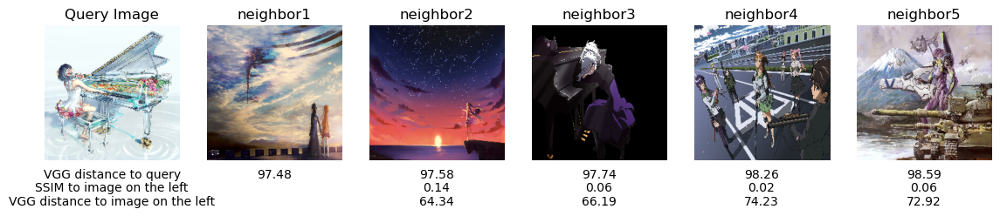

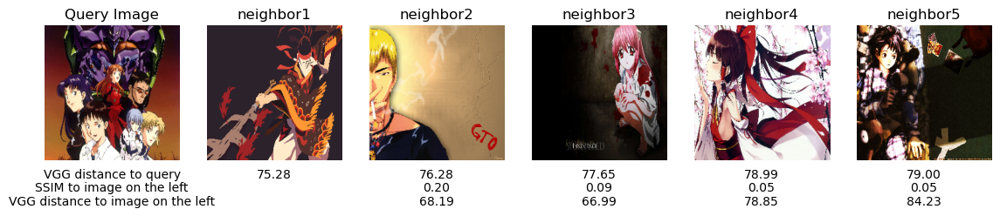

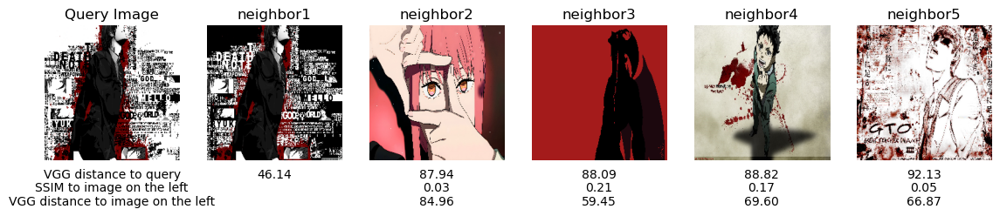

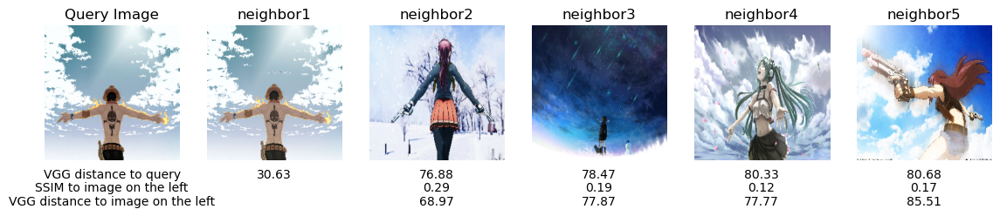

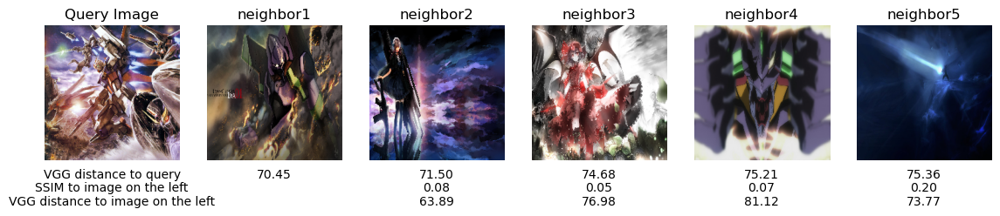

...

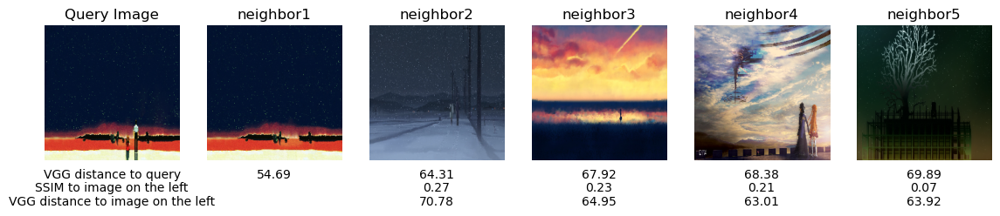

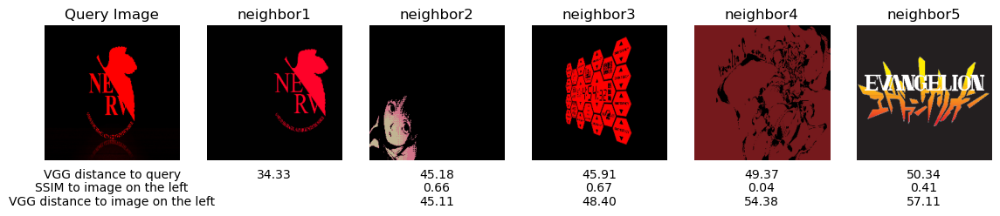

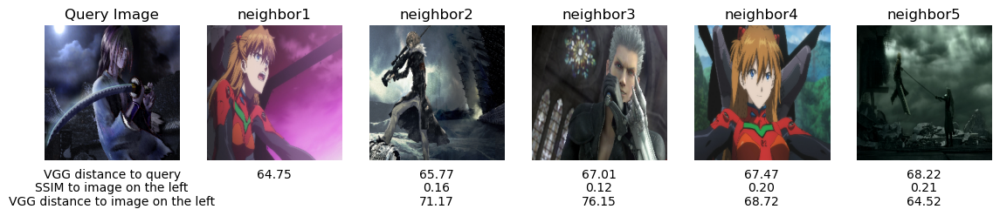

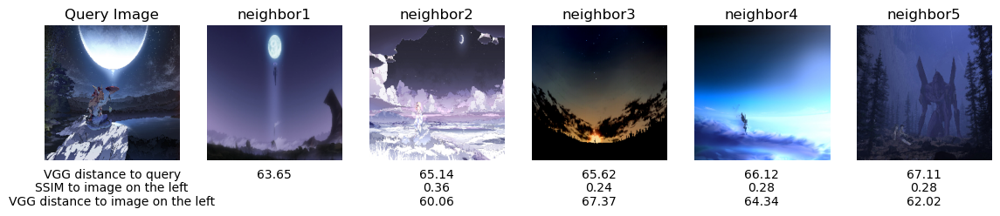

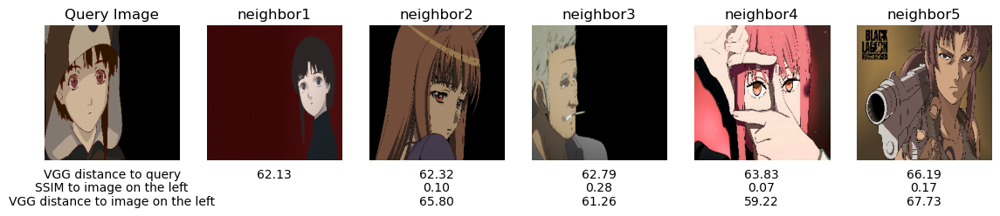

In [17]:
from utils import show_images

# Get embeddings
print('Loading test embeddings')
test_embeddings = load_precomp_embeddings(test_filenames, '23')
print('Loading train embeddings')
train_embeddings = load_precomp_embeddings(train_filenames, '23')

# Fit KNN model to train embeddings
print('Fitting KNN model to embeddings')
knnbr = NearestNeighbors(n_neighbors = 6, algorithm = 'ball_tree').fit(train_embeddings)   

knn_images = []
# Iterate through all test images (last 'test_size' images of dataset)
for i in range(len(test_embeddings)):
    img = test_images[i]
    e = test_embeddings[i].reshape(1, -1)
    knn_images, knn_E, distances = get_knn_for_query(e, knnbr, train_images, train_embeddings)

    pair_distances_img = get_query_distances(knn_images, type='image')
    pair_distances_emb = get_query_distances(knn_E, type='embedding')


    # show the results
    result = [img] + knn_images
    show_images(result, distances, pair_distances_img, pair_distances_emb, norm=False)